In [1]:
# imports

from __future__ import division
import codecs
import json
from itertools import chain, izip, permutations, combinations
from collections import Counter, defaultdict
import ConfigParser
import os
import random
from textwrap import fill
import scipy
import sys
from copy import deepcopy

from nltk.parse import CoreNLPParser
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from IPython.display import Latex, display

pd.set_option('max_colwidth', 250)

In [10]:
# Load up config file (needs path; adapt env var if necessary); local imports

# load config file, set up paths, make project-specific imports
config_path = os.environ.get('VISCONF')
if not config_path:
    # try default location, if not in environment
    default_path_to_config = '../Config/default.cfg'
    if os.path.isfile(default_path_to_config):
        config_path = default_path_to_config

assert config_path is not None, 'You need to specify the path to the config file via environment variable VISCONF.'        

config = ConfigParser.SafeConfigParser()
with codecs.open(config_path, 'r', encoding='utf-8') as f:
    config.readfp(f)

corpora_base = config.get('DEFAULT', 'corpora_base')
preproc_path = config.get('DSGV-PATHS', 'preproc_path')
dsgv_home = config.get('DSGV-PATHS', 'dsgv_home')


sys.path.append(dsgv_home + '/Utils')
from utils import icorpus_code, plot_labelled_bb, get_image_filename, query_by_id
from utils import plot_img_cropped, plot_img_ax, invert_dict, get_a_by_b, get_image_part
sys.path.append(dsgv_home + '/WACs/WAC_Utils')
from wac_utils import create_word2den, is_relational
sys.path.append(dsgv_home + '/Preproc')
from sim_preproc import load_imsim, n_most_sim

sys.path.append('../Common')
from data_utils import load_dfs, plot_rel_by_relid, get_obj_bb, compute_distance_objs
from data_utils import get_obj_key, compute_relpos_relargs_row, get_all_predicate
from data_utils import compute_distance_relargs_row, get_rel_type, get_rel_instances
from data_utils import compute_obj_sizes_row

In [3]:
# Load up preprocessed DataFrames. Slow!
# These DataFrames are the result of pre-processing the original corpus data,
# as per dsg-vision/Preprocessing/preproc.py

df_names = ['saiapr_bbdf', 'saiapr_refdf',
            'mscoco_bbdf', 'cococapdf', 'mscoco_catsdf',
            'refcoco_refdf', 'refcocoplus_refdf', 'grex_refdf',
            'vgregdf', 'vgimgdf', 'vgobjdf', 'vgreldf',
            'vgattdf', 'vgvqadf', 'vgpardf', 
            'flickr_bbdf', 'flickr_capdf', 'flickr_objdf']
df = load_dfs(preproc_path, df_names)

# a derived DF, containing only those region descriptions which I was able to resolve
df['vgpregdf'] = df['vgregdf'][df['vgregdf']['pphrase'].notnull() & 
                               (df['vgregdf']['pphrase'] != '')]

# easier to look up:
cococat = dict(zip(df['mscoco_catsdf'].index, df['mscoco_catsdf']['cat'].values))

In [68]:
def get_patch_from_triple(row, resize=True, xs=224, ys=224):
    # get_image_part() return tuple, we only need the image patch
    return get_image_part(config, (None, None),
                          row['i_corpus'], row['image_id'], row['bb'], resize=resize, xs=xs, ys=ys)[1]

In [69]:
def get_all_objects(df, name):
    return df[df['name'] == name]['i_corpus image_id bb'.split()]

In [70]:
def plot_grid(img_list, n_cols=10, figsize=(15, 15)):
    n = len(img_list)
    n_rows = n // n_cols + (1 if n % n_cols else 0)

    fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, 15))
    fig.subplots_adjust(hspace=0, wspace=0)

    for n, img in enumerate(img_list):
        this_ax = ax[n // n_cols, n % n_cols]
        this_ax.imshow(img)
        this_ax.axis('off')
        
def sample_n_get_patch(df, name, n=100):
    return get_all_objects(df, name).sample(n).apply(get_patch_from_triple, axis=1)

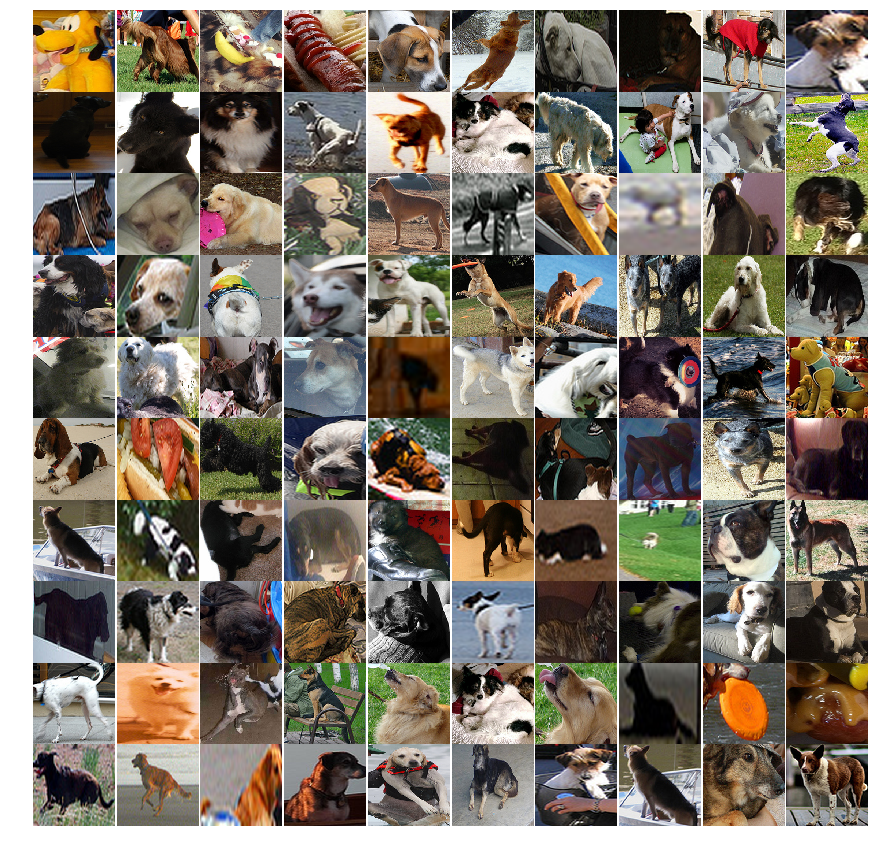

In [103]:
plot_grid(sample_n_get_patch(df['vgobjdf'], 'dog'))

In [76]:
w2d = create_word2den(df['refcoco_refdf'])

In [128]:
def plot_ref_word(df, w2d, word, n=100):
    mcols = 'i_corpus image_id region_id'.split()
    tmpdf = pd.DataFrame(w2d[word], columns=mcols)
    n = min(n, len(tmpdf))
    plot_grid(pd.merge(df, tmpdf, how='inner', on=mcols).sample(n).apply(get_patch_from_triple, axis=1))

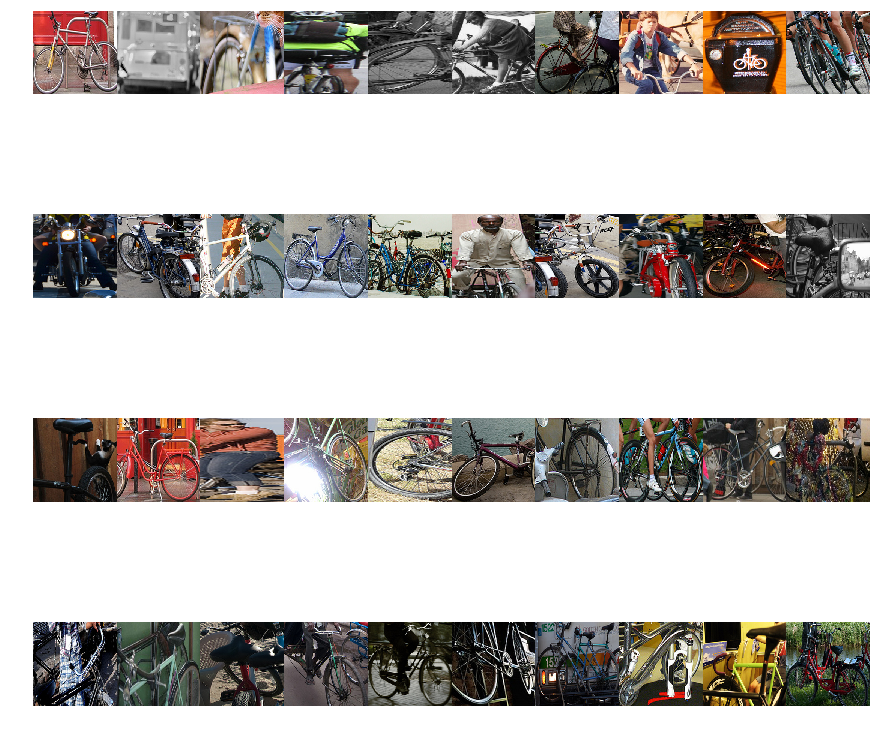

In [129]:
plot_ref_word(df['mscoco_bbdf'], w2d, 'bicycle')

In [130]:
w2d_saiapr = create_word2den(df['saiapr_refdf'])

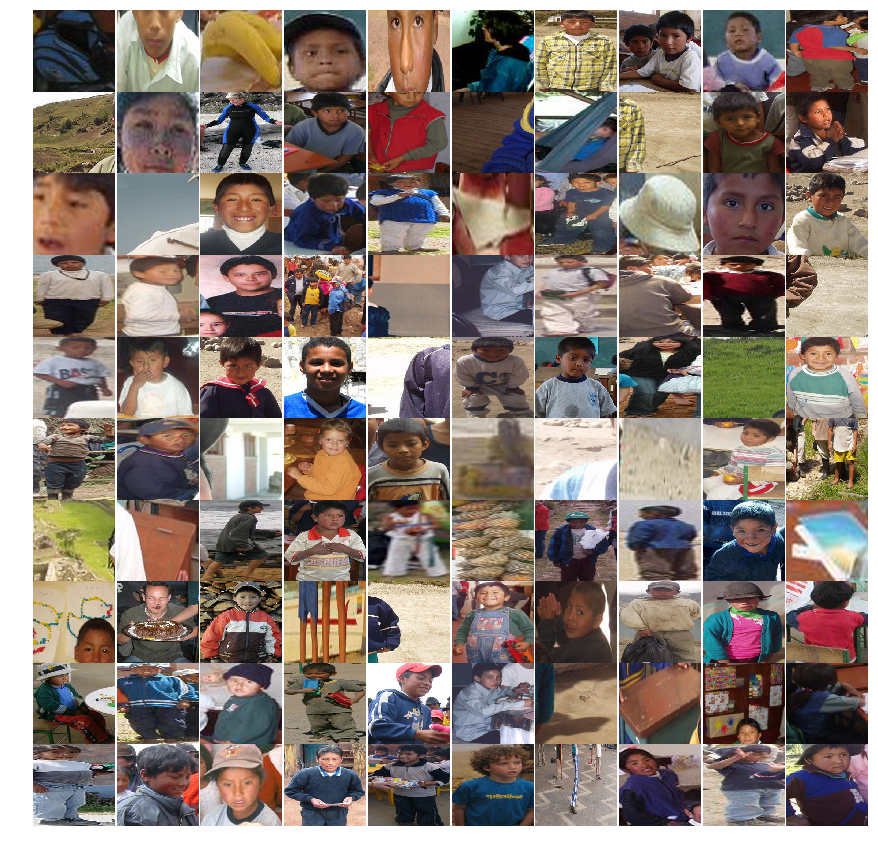

In [131]:
plot_ref_word(df['saiapr_bbdf'], w2d_saiapr, 'boy')

In [162]:
w2d_joined = {}
combined_vocab = list(set(w2d.keys()).union(set(w2d_saiapr.keys())))
for word in combined_vocab:
    this_list = []
    if word in w2d:
        this_list.extend(w2d[word])
    if word in w2d_saiapr:
        this_list.extend(w2d_saiapr[word])
    w2d_joined[word] = this_list

In [134]:
saia_mscoco_bbdf = pd.concat([df['mscoco_bbdf'], df['saiapr_bbdf']])

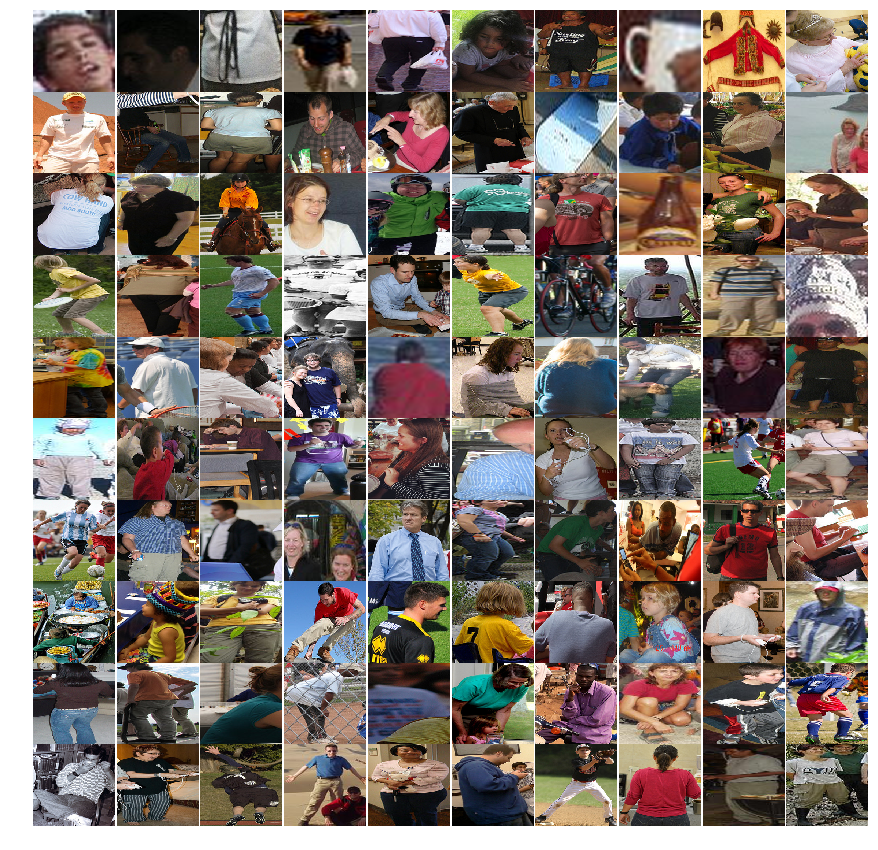

In [165]:
plot_ref_word(saia_mscoco_bbdf, w2d_joined, 'shirt')

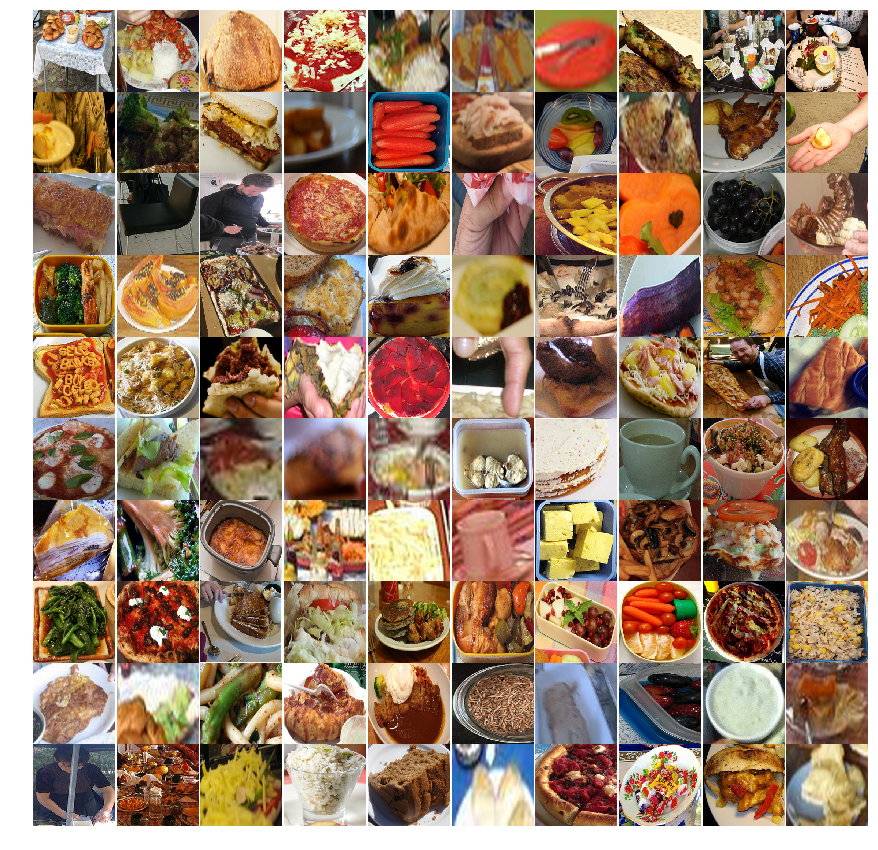

In [164]:
plot_ref_word(saia_mscoco_bbdf, w2d_joined, 'food')

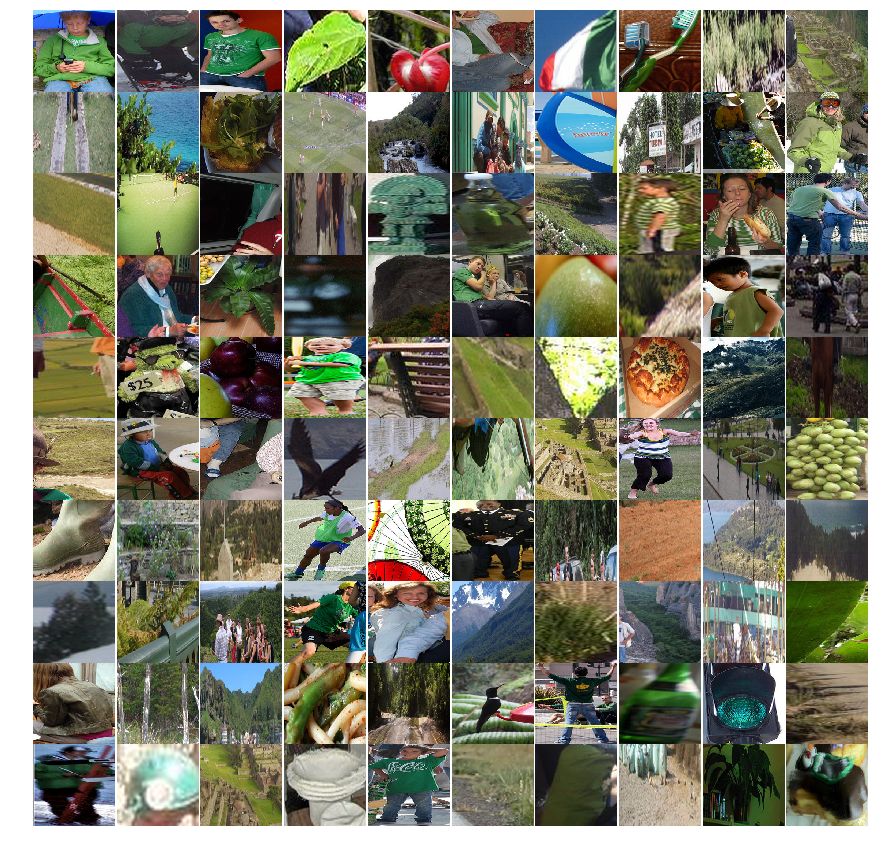

In [166]:
plot_ref_word(saia_mscoco_bbdf, w2d_joined, 'green')

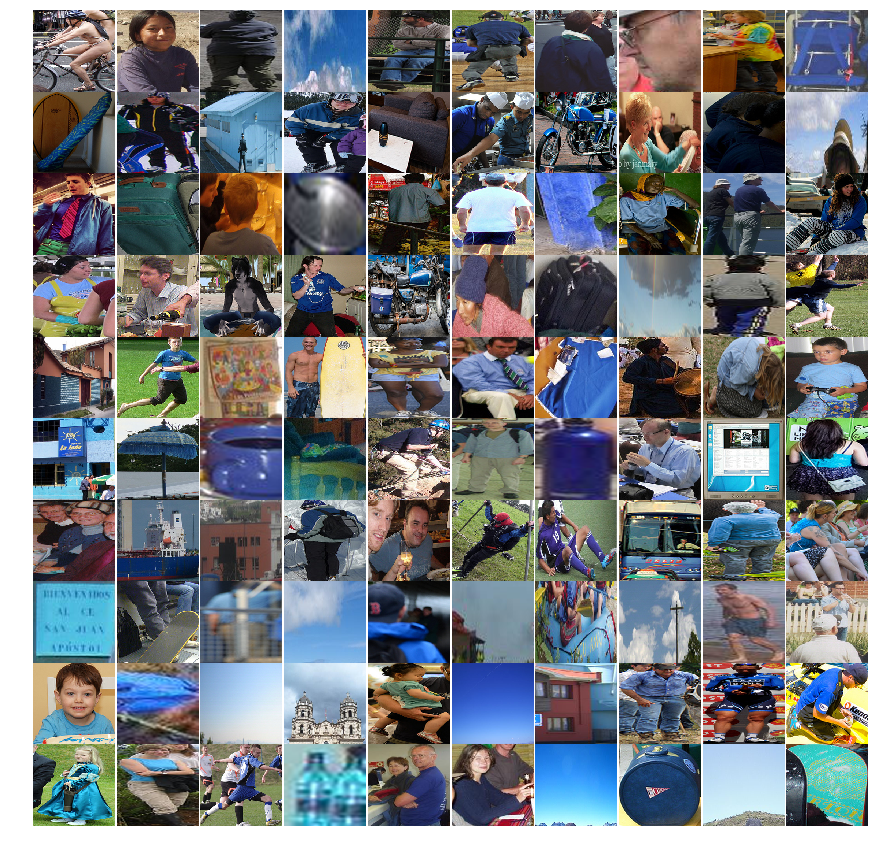

In [167]:
plot_ref_word(saia_mscoco_bbdf, w2d_joined, 'blue')